In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display, HTML
from PIL import Image

print(cv.__version__)

4.8.0


# **Original image and its shifted Fourier Transform**

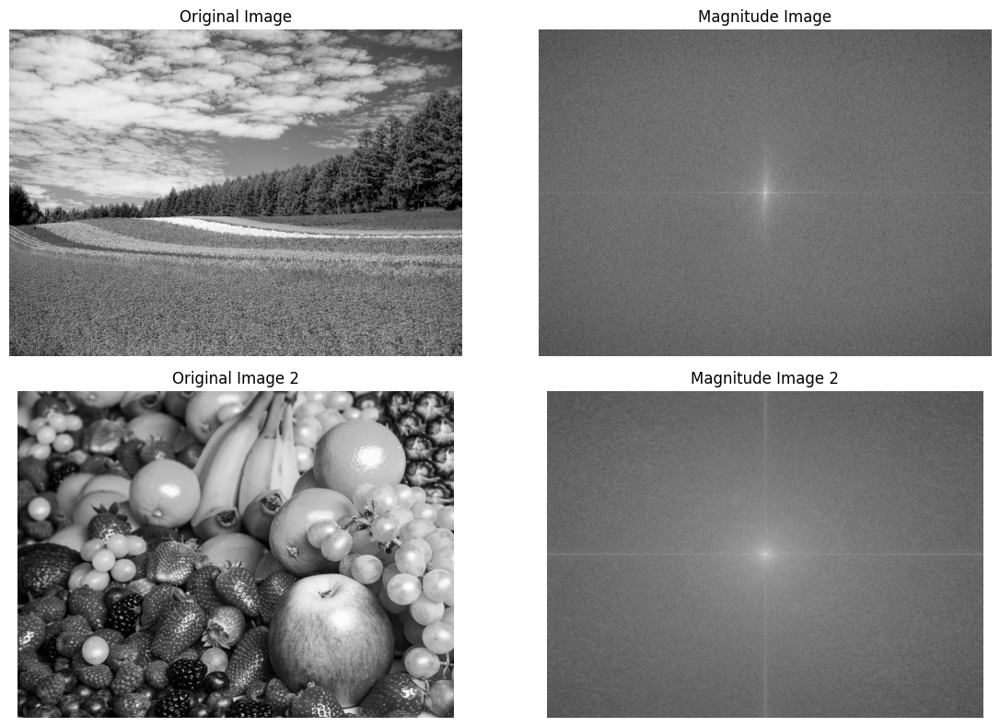

In [4]:
image = cv.imread('./original_image/flower1.jpg', cv.IMREAD_GRAYSCALE)
image2 = cv.imread('./original_image/fruit.jpg', cv.IMREAD_GRAYSCALE)

# Compute the FFT of the image
f_transform = np.fft.fft2(image)
f_transform_shifted = np.fft.fftshift(f_transform)

f_transform2 = np.fft.fft2(image2)
f_transform_shifted2 = np.fft.fftshift(f_transform2)

# Compute the magnitude spectrum (log-scaled for better visualization)
magnitude_spectrum = np.log(np.abs(f_transform_shifted) + 1)
magnitude_spectrum2 = np.log(np.abs(f_transform_shifted2) + 1)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figure size as needed

# Display each image in a subplot
axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(magnitude_spectrum, cmap='gray')
axes[0, 1].set_title('Magnitude Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(image2, cmap='gray')
axes[1, 0].set_title('Original Image 2')
axes[1, 0].axis('off')

axes[1, 1].imshow(magnitude_spectrum2, cmap='gray')
axes[1, 1].set_title('Magnitude Image 2')
axes[1, 1].axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


<br>
<br>
<br>


# **1. Notch Filter (lowpass & highpass)**

In [6]:
def notchHighPassFilter(image, image_name, radius):
    # Compute the FFT of the image
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Define the radius (r) for the low-pass filter
    r = radius

    # Create a notch filter in the frequency domain
    rows, cols = image.shape
    notch_filter = np.ones((rows, cols), np.uint8)
    center = (rows // 2, cols // 2)

    # Create a circular region of zeros in the notch filter
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0]) ** 2 + (j - center[1]) ** 2) <= r:
                notch_filter[i, j] = 0


    # Apply the notch filter in the frequency domain
    filtered_transform = f_transform_shifted * notch_filter

    # Inverse FFT to obtain the enhanced image
    enhanced_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_transform)))
    cv.imwrite(f'./edited_image/notch_highpass_{radius}_{image_name}.jpg', enhanced_image)
    
    # Create a 1x3 grid of subplots
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Display each image in a subplot
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(enhanced_image, cmap='gray')
    axes[1].set_title('Highpass Image')
    axes[1].axis('off')

    axes[2].imshow(notch_filter, cmap='gray')
    axes[2].set_title(f'notch filter (r={radius})')
    axes[2].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()
    
def notchLowPassFilter(image, image_name, radius):
    # Compute the FFT of the image
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Define the radius (r) for the low-pass filter
    r = radius

    # Create a notch filter in the frequency domain
    rows, cols = image.shape
    notch_filter = np.zeros((rows, cols), np.uint8)
    center = (rows // 2, cols // 2)

    # Create a circular region of zeros in the notch filter
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0]) ** 2 + (j - center[1]) ** 2) <= r:
                notch_filter[i, j] = 1


    # Apply the notch filter in the frequency domain
    filtered_transform = f_transform_shifted * notch_filter

    # Inverse FFT to obtain the enhanced image
    enhanced_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_transform)))
    cv.imwrite(f'./edited_image/notch_highpass_{radius}_{image_name}.jpg', enhanced_image)
    
    # Create a 1x3 grid of subplots
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Display each image in a subplot
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(enhanced_image, cmap='gray')
    axes[1].set_title('Lowpass Image')
    axes[1].axis('off')

    axes[2].imshow(notch_filter, cmap='gray')
    axes[2].set_title(f'notch filter (r={radius})')
    axes[2].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

# **Notch filter with flower image**

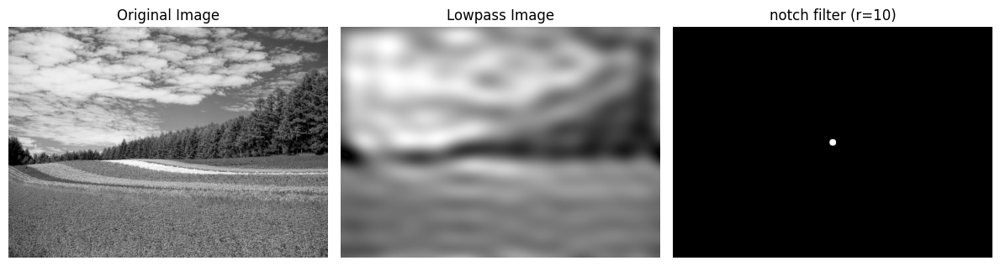

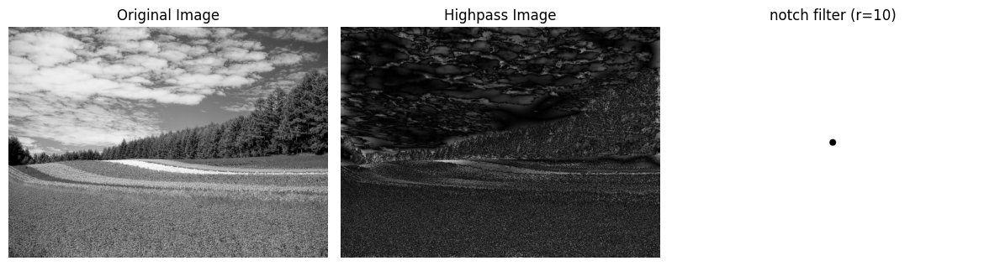

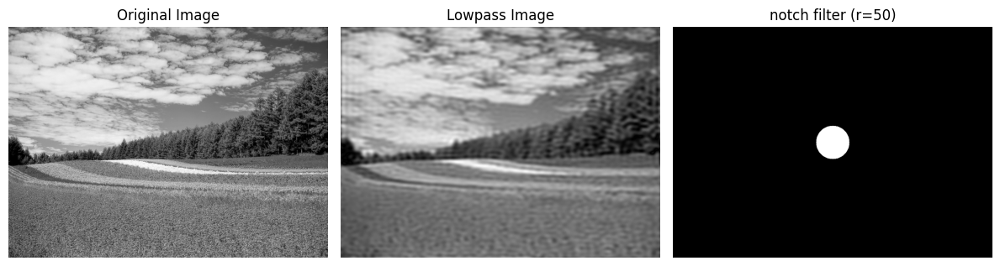

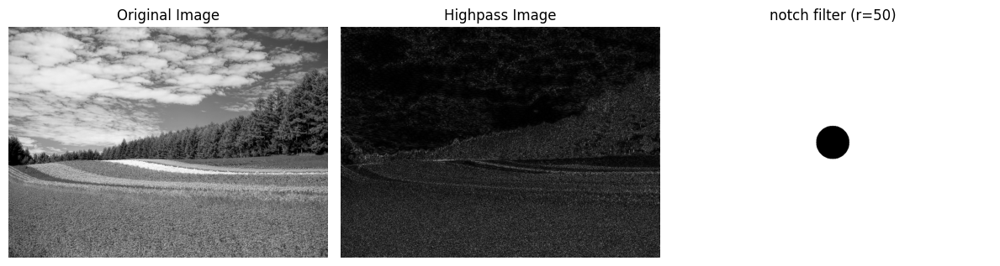

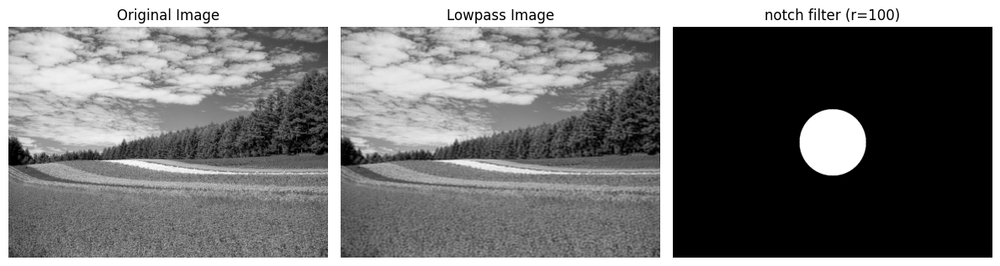

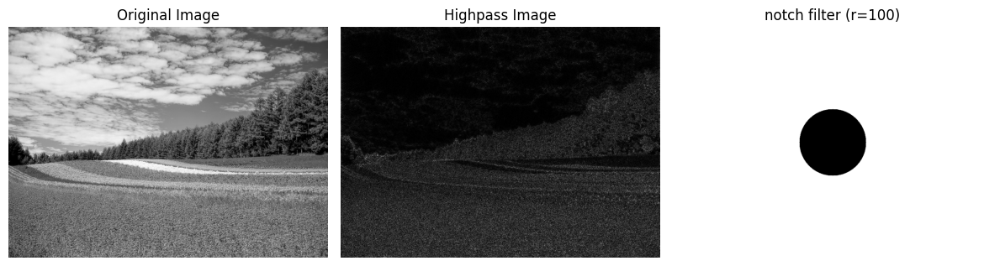

In [25]:
image = cv.imread('./original_image/flower1.jpg', cv.IMREAD_GRAYSCALE)

radius = [10, 50, 100]

for r in radius:
    enhanced_image = notchLowPassFilter(image, "flower", r)
    enhanced_image2 = notchHighPassFilter(image, "flower", r)

# **Notch filter with fruit image**

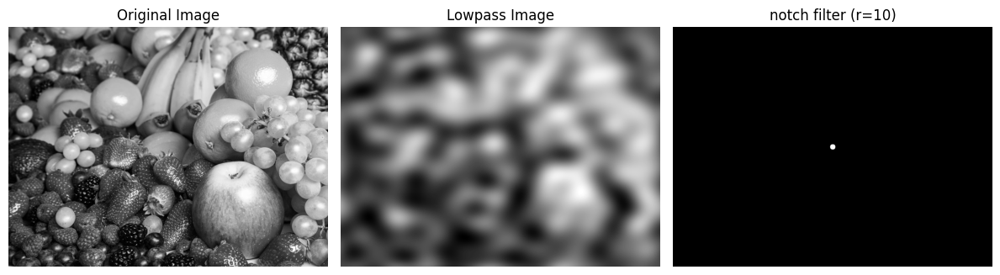

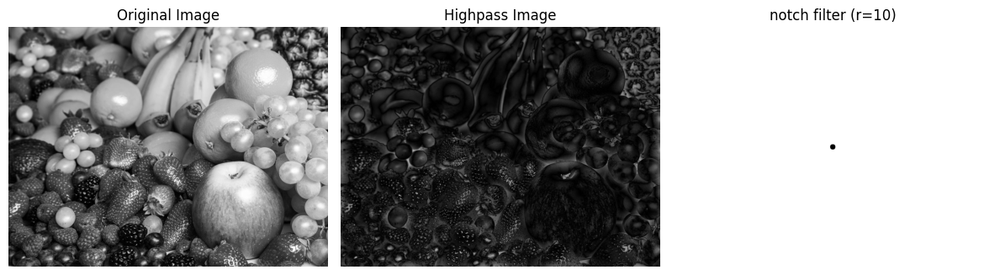

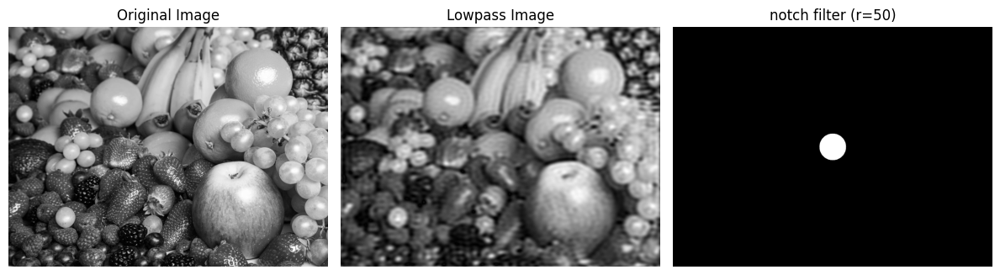

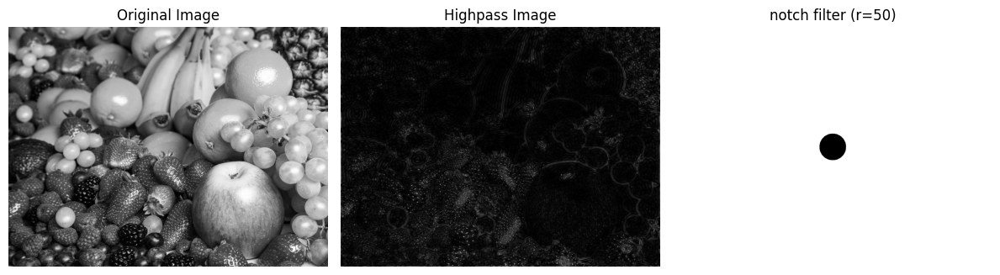

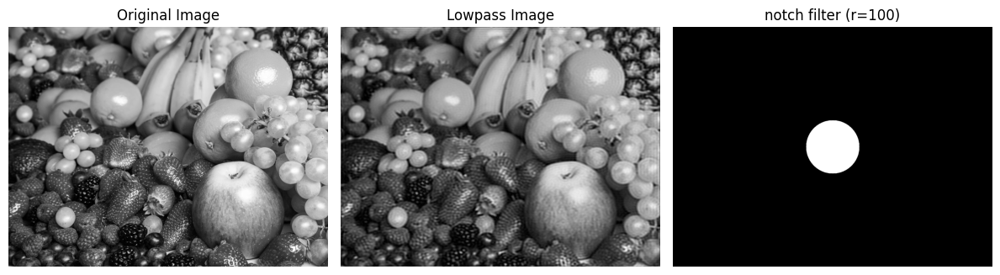

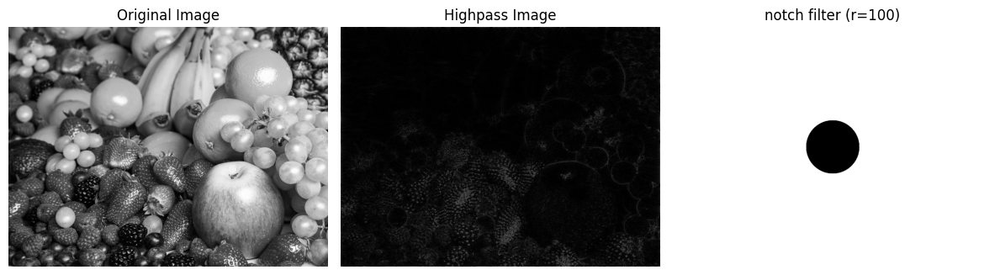

In [26]:
image = cv.imread('./original_image/fruit.jpg', cv.IMREAD_GRAYSCALE)

radius = [10, 50, 100]

for r in radius:
    enhanced_image = notchLowPassFilter(image, "fruit", r)
    enhanced_image2 = notchHighPassFilter(image, "fruit", r)

<br>

>#####  **จะเห็นได้ว่า Low pass filter จะกรองเฉพาะส่วนที่เป็นความถี่ต่ำซึ่งรวมกันอยู่ตรงกลางของภาพ Magnitude ทำให้ส่วนที่เป็นรายละเอียด/ขอบ ซึ่งมีความถี่สูงถูกกรองออกไป ภาพที่ได้ออกมาจึงมีความเบลอมากกว่าเดิมและเพิ่มขึ้นหากรัศมีของ notch filter เล็กลง โดยจะเห็นได้ว่าที่ r=100 จะได้ภาพไม่ต่างจากเดิมมากเนื่องจากมีความถี่ต่ำส่วนน้อยที่ถูกกรองออกไป ส่วน High pass filter จะทำงานตรงกันข้ามกัน (reversing)**

<br>
<br>
<br>

# **2. Gaussian Filter (lowpass & highpass)**

In [7]:
def gaussianLowPassFilter(image, image_name, d0):
    
    # Compute the FFT of the image
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Define the cutoff frequency D0
    D0 = d0

    # Create a Gaussian filter in the frequency domain
    rows, cols = image.shape
    center = (rows // 2, cols // 2)
    x = np.linspace(0, cols - 1, cols)
    y = np.linspace(0, rows - 1, rows)
    X, Y = np.meshgrid(x, y)
    D = np.sqrt((X - center[1]) ** 2 + (Y - center[0]) ** 2)
    H = np.exp(-((D ** 2) / (2 * (D0 ** 2))))

    # Apply the Gaussian filter in the frequency domain
    filtered_transform = f_transform_shifted * H

    # Inverse FFT to obtain the filtered image
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_transform)))
    
    # Create a 1x3 grid of subplots
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Display each image in a subplot
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(filtered_image, cmap='gray')
    axes[1].set_title('Lowpass Image')
    axes[1].axis('off')

    axes[2].imshow(H, cmap='gray')
    axes[2].set_title(f'Gaussian filter (D0 = {D0})')
    axes[2].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()
    
def gaussianHighPassFilter(image, image_name, d0):
    
    # Compute the FFT of the image
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Define the cutoff frequency D0
    D0 = d0

    # Create a Gaussian filter in the frequency domain
    rows, cols = image.shape
    center = (rows // 2, cols // 2)
    x = np.linspace(0, cols - 1, cols)
    y = np.linspace(0, rows - 1, rows)
    X, Y = np.meshgrid(x, y)
    D = np.sqrt((X - center[1]) ** 2 + (Y - center[0]) ** 2)
    H = 1 - np.exp(-((D ** 2) / (2 * (D0 ** 2))))

    # Apply the Gaussian filter in the frequency domain
    filtered_transform = f_transform_shifted * H

    # Inverse FFT to obtain the filtered image
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_transform)))
    
    # Create a 1x3 grid of subplots
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Display each image in a subplot
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(filtered_image, cmap='gray')
    axes[1].set_title('Highpass Image')
    axes[1].axis('off')

    axes[2].imshow(H, cmap='gray')
    axes[2].set_title(f'Gaussian filter (D0 = {D0})')
    axes[2].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

# **Gaussian Filter with flower image**

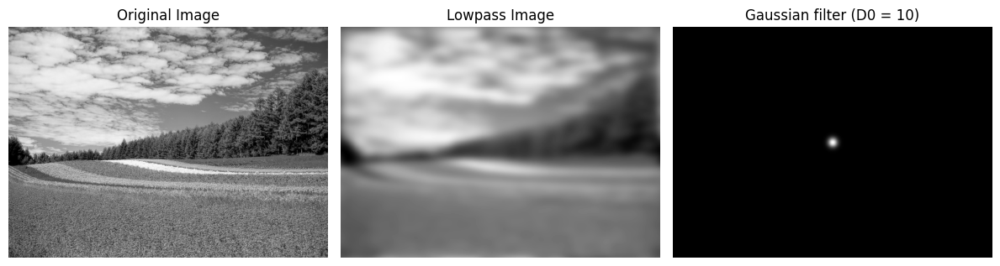

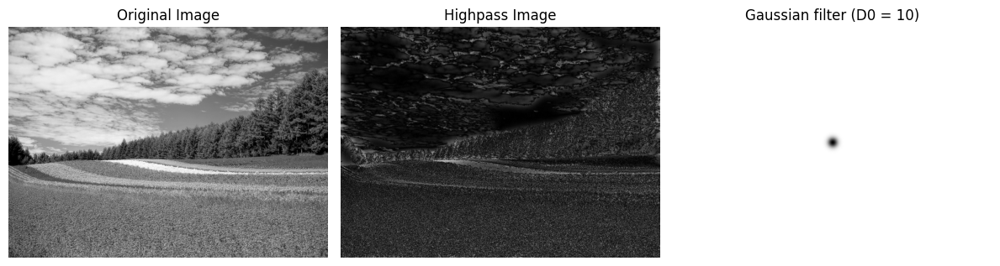

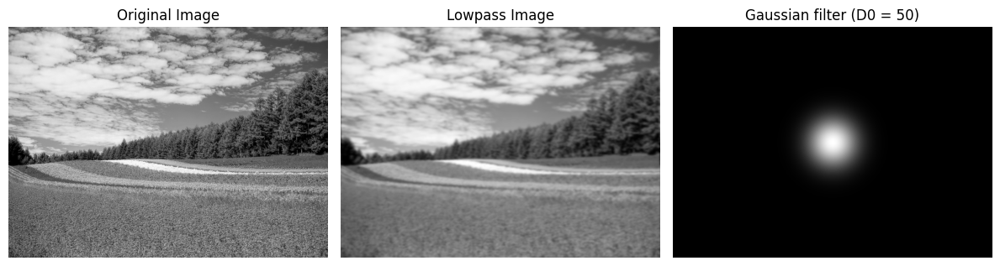

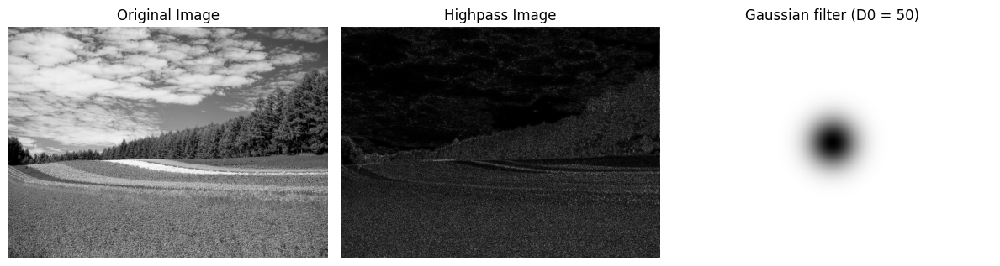

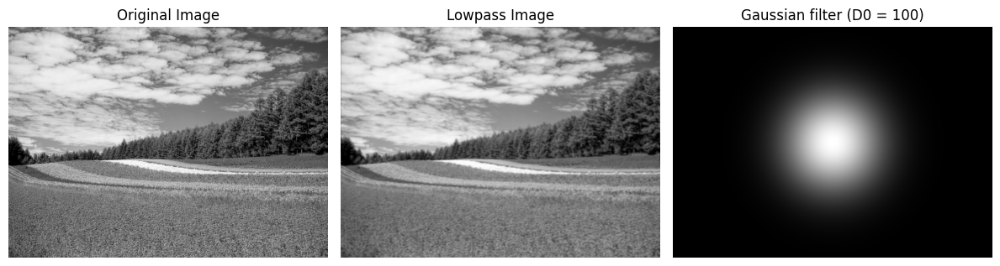

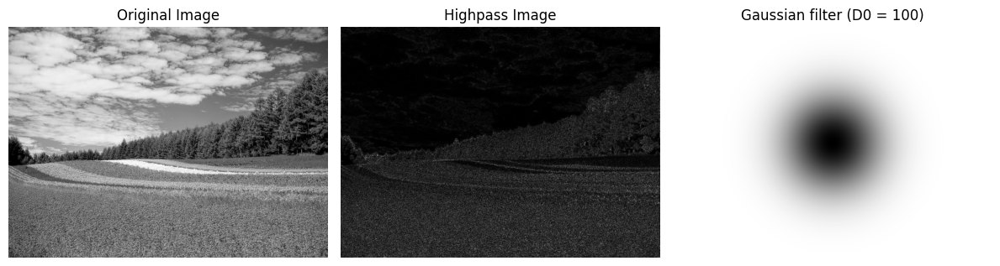

In [37]:
image = cv.imread('./original_image/flower1.jpg', cv.IMREAD_GRAYSCALE)

D0 = [10, 50, 100]

for d in D0:
    enhanced_image = gaussianLowPassFilter(image, "flower", d)
    enhanced_image2 = gaussianHighPassFilter(image, "flower", d)

# **Gaussian Filter with fruit image**

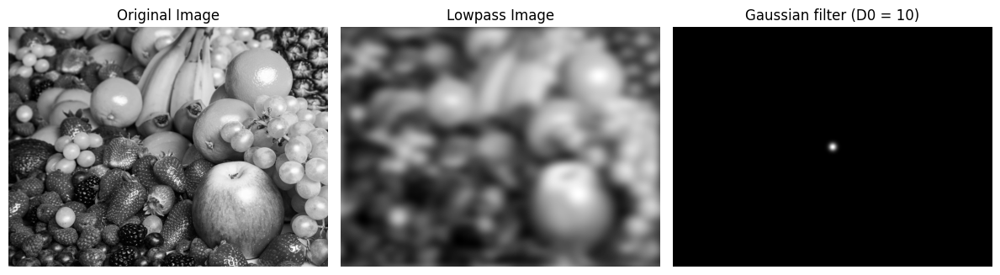

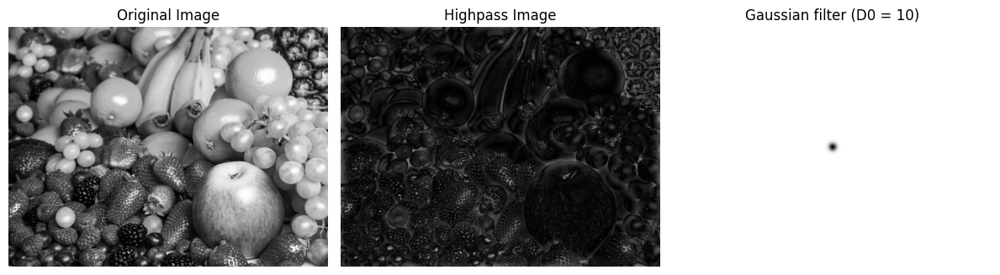

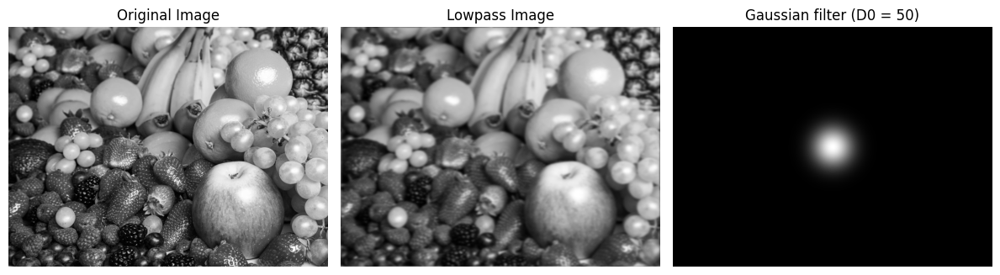

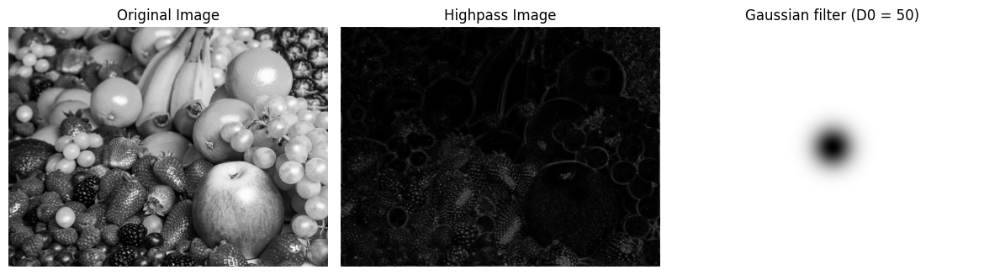

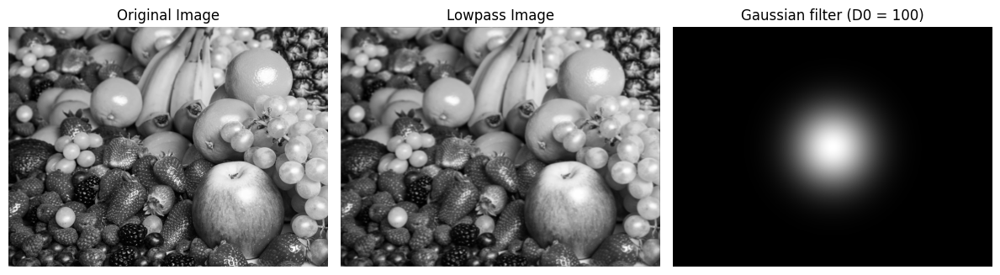

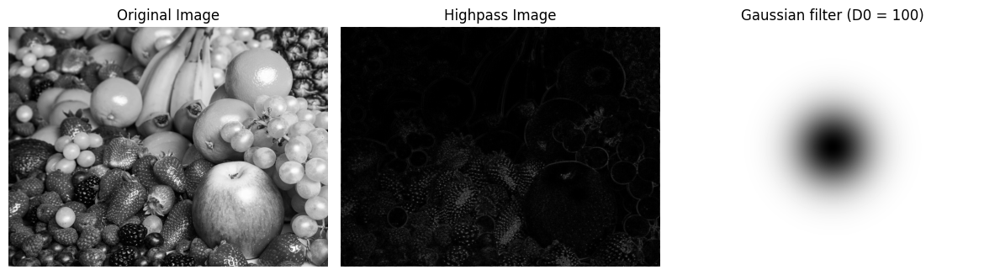

In [38]:
image = cv.imread('./original_image/fruit.jpg', cv.IMREAD_GRAYSCALE)

D0 = [10, 50, 100]

for d in D0:
    enhanced_image = gaussianLowPassFilter(image, "fruit", d)
    enhanced_image2 = gaussianHighPassFilter(image, "fruit", d)

<br>

> ##### **จะเห็นได้ว่า Low pass filter ซึ่งใช้ Gaussian Filer ให้ผลลัพธ์ที่ใกล้เคียงกับ notch filter มากๆด้วย D0 ที่เท่ากับ radius เช่นเดียวกันกับ High pass filter แต่จะได้ภาพ filter ที่ต่างกันโดยที่วงกลมของ Gaussian จะค่อยๆเบลอลงเมื่อออกห่างจากจุดศูนย์กลาง**

<br>
<br>
<br>

# **3. Magnitude of noisy flower both horizontal and vertical noise**

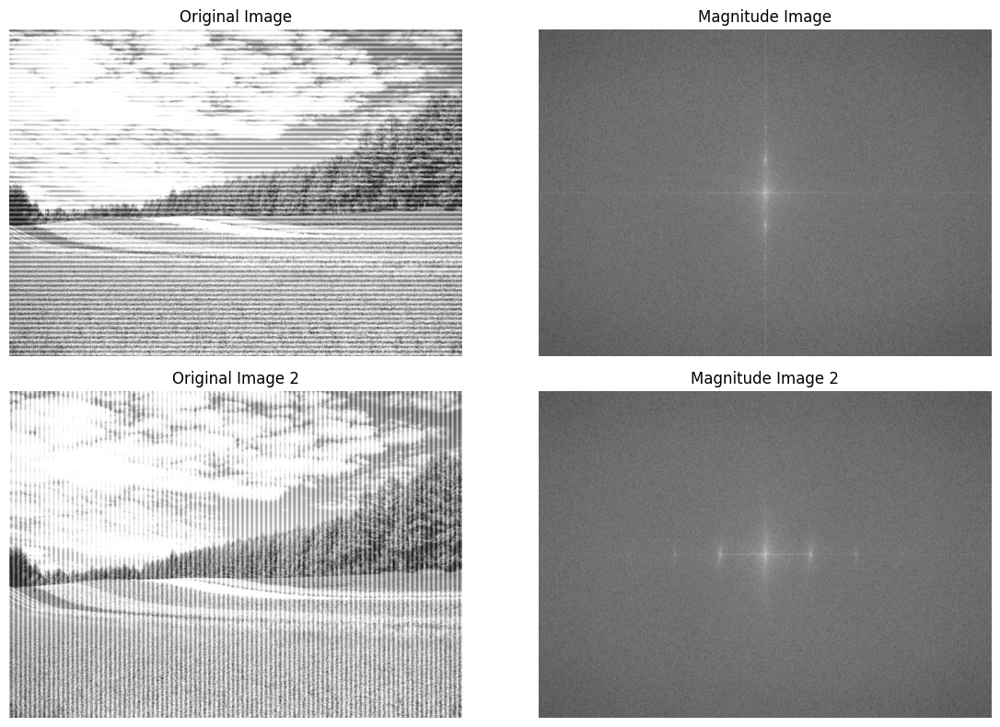

In [37]:
image = cv.imread('./original_image/Noisy_flower1_horizontal.jpg', cv.IMREAD_GRAYSCALE)
image2 = cv.imread('./original_image/Noisy_flower1_vertical.jpg', cv.IMREAD_GRAYSCALE)

# Compute the FFT of the image
f_transform = np.fft.fft2(image)
f_transform_shifted = np.fft.fftshift(f_transform)

f_transform2 = np.fft.fft2(image2)
f_transform_shifted2 = np.fft.fftshift(f_transform2)

# Compute the magnitude spectrum (log-scaled for better visualization)
magnitude_spectrum = np.log(np.abs(f_transform_shifted) + 1)
magnitude_spectrum2 = np.log(np.abs(f_transform_shifted2) + 1)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figure size as needed

# Display each image in a subplot
axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(magnitude_spectrum, cmap='gray')
axes[0, 1].set_title('Magnitude Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(image2, cmap='gray')
axes[1, 0].set_title('Original Image 2')
axes[1, 0].axis('off')

axes[1, 1].imshow(magnitude_spectrum2, cmap='gray')
axes[1, 1].set_title('Magnitude Image 2')
axes[1, 1].axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


# **Horizontal noise with notch and gaussian filter**

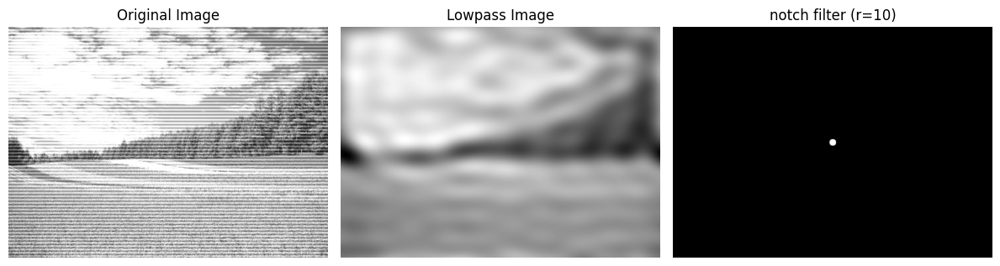

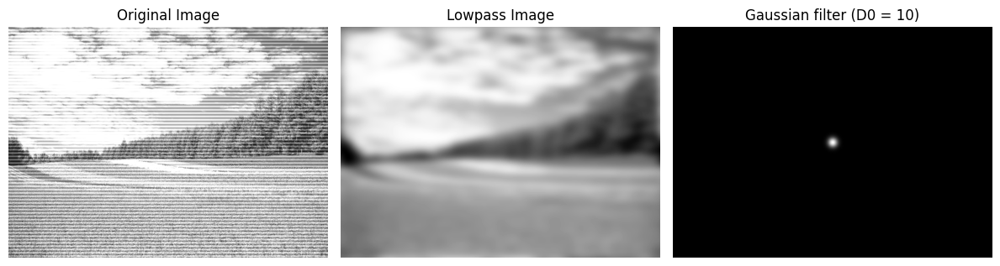

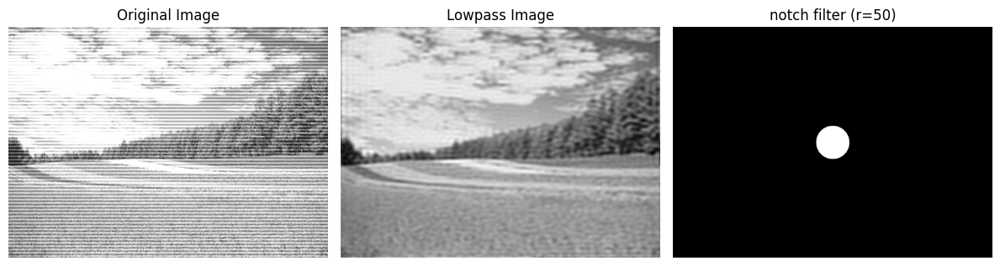

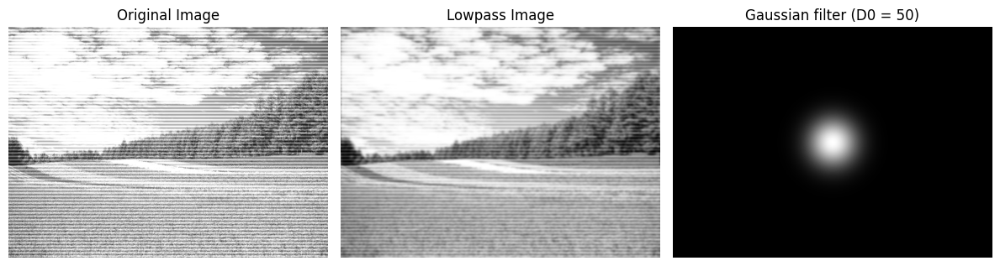

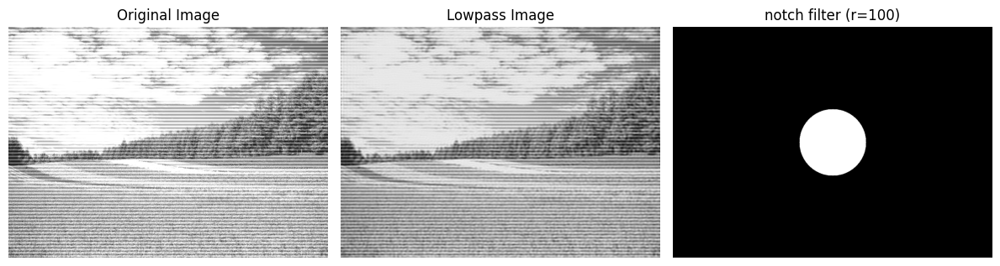

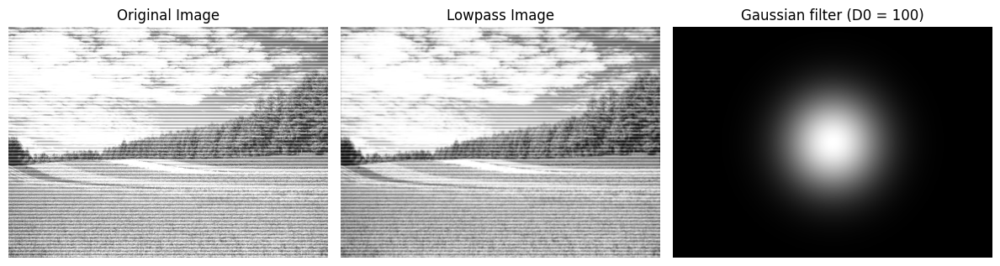

In [17]:

image = cv.imread('./original_image/Noisy_flower1_horizontal.jpg', cv.IMREAD_GRAYSCALE)

radius = [10, 50, 100]

for r in radius:
    enhanced_image = notchLowPassFilter(image, "fruit", r)
    enhanced_image2 = gaussianLowPassFilter(image, "flower", r)


# **Vertical noise with notch and gaussian filter**

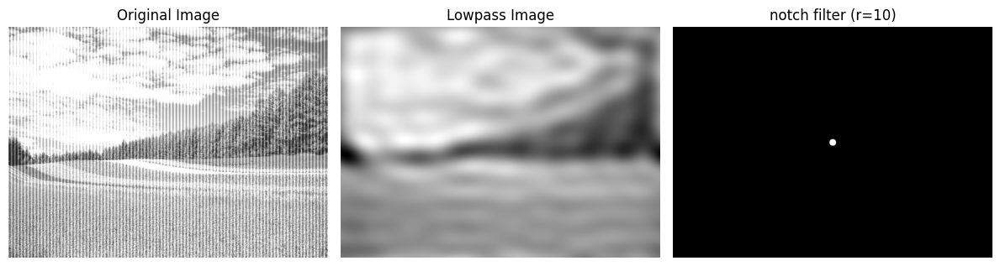

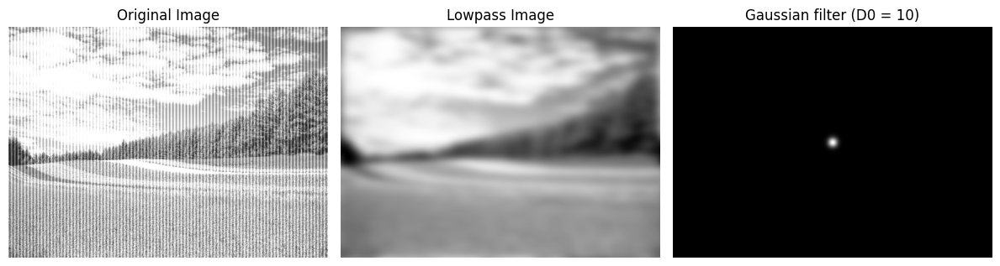

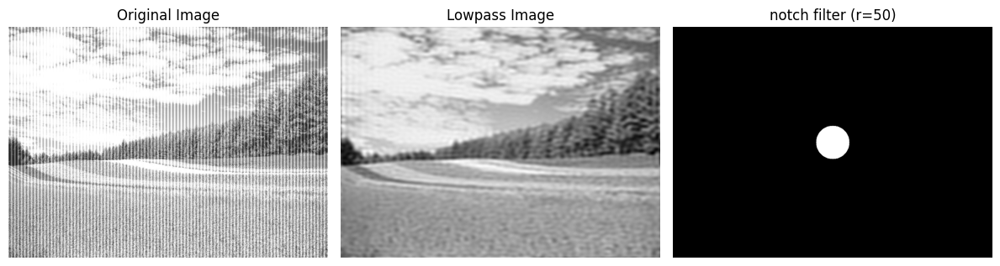

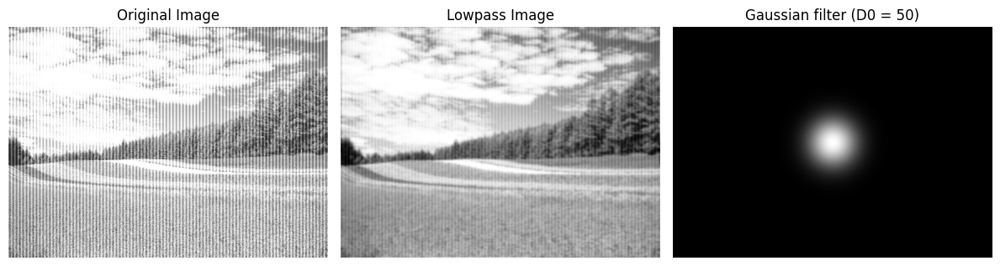

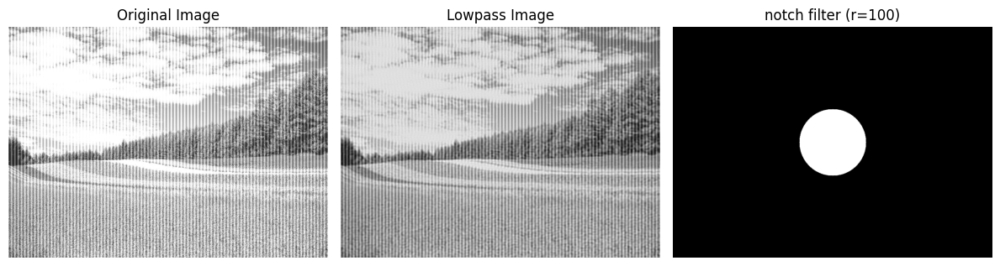

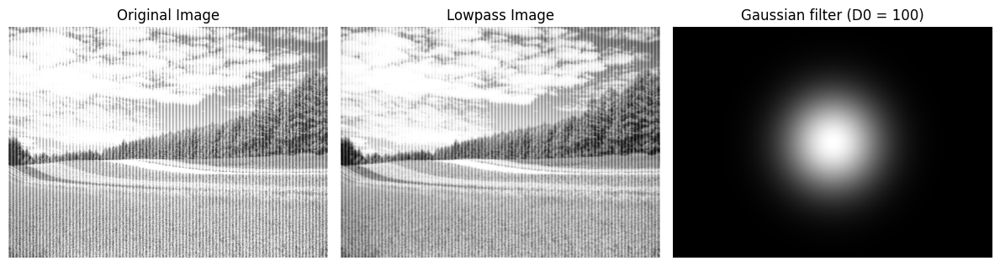

In [18]:
image = cv.imread('./original_image/Noisy_flower1_vertical.jpg', cv.IMREAD_GRAYSCALE)

radius = [10, 50, 100]

for r in radius:
    enhanced_image = notchLowPassFilter(image, "fruit", r)
    enhanced_image2 = gaussianLowPassFilter(image, "flower", r)


##### **จากภาพจะเห็นได้ว่าต้องใช้ Low pass filter เพื่อนำส่วนที่เป็น noise ออกไปซึ่งผลลัพธ์ที่ได้จะแตกต่างกันไปตาม radius/D0 ที่กำหนด และจะเห็นได้ชัดว่า Notch มีประสิทธิภาพดีกว่า Gaussian ที่ระดับ radius/D0 เท่ากัน โดย radius/D0 = 50 จะให้ผลลัพธ์ดีที่สุด ส่วน radius/D0 = 10 จะได้ภาพที่เบลอมากๆ ในขณะที่ radius/D0 = 100 ได้ภาพที่แทบไม่ต่างจากภาพต้นฉบับ**

##### **สาเหตุที่ radius/D = 50 ให้ผลลัพธ์ที่ดีสุดเนื่องจากหากสังเกตจาก magnitude ของภาพที่มี noise จะสังเกตเห็นว่าจะมีส่วนที่เป็นความถี่ต่ำของภาพอยู่ที่จุดศูนย์กลางของวงกลม และจะมีจุดเรืองแสงที่อยู่ห่างออกไปจากจุดศูนย์กลางด้วยระยะทางเท่าๆกันโดยจุดนั้นคือส่วนที่เป็น periodic noise การที่ใช้ filter ซึ่งมี radius = 50 จะทำให้ส่วนที่เป็น noise ในภาพ magnitude ถูกกรองออกไปมากที่สุดแต่ส่วนที่เป็นรายละเอียดสูงก็ถูกกรองออกไปด้วยเช่นกันทำให้ภาพที่ได้มีความเบลอ ส่วนถ้า radius = 100 จะได้ผลลัพธ์เหมือนกับภาพต้นฉบับมากเนื่องจากแทบไม่มี noise ถูกกรองออกไปเลย ในขณะที่ radius = 10 จะทำให้ภาพเบลอมากแต่ noise ก็ถูกกรองออกไปจนหมดเช่นกัน**

##### **สาเหตุที่ notch ให้ผลดีกว่า gaussian อาจจะเป็นเพราะว่า gaussian ไม่ใช่วงกลมที่คงที่ นั่นคือ มีความเบลอมากยิ่งขึ้นเมื่อรัศมีของวงกลมเพิ่มมากยิ่งขึ้นทำให้ noise ถูกกรองออกไปเพียงบางส่วนไม่ได้ถูกกรองออกไปทั้งหมดเหมือนกับ notch เนื่องจาก periodic noise มีการวางตัวแบบคงที่ทำให้การใช้ notch filter ที่มีวงกลมคงที่เหมือนกันมีประสิทธิภาพมากกว่า**

##### **สุดท้าย อาจใช้ enhancing filter อื่นๆ เช่น image sharpening เพื่อเพิ่มความคมชัดและรายละเอียดของภาพที่หายไปจากการใช้ notch filter ร่วมด้วยเพื่อให้ได้ผลลัพธ์ที่ดียิ่งขึ้น**